# Sliding Window Introgression Analysis

This notebook performs genome-wide sliding window analysis to map introgression across the genome.

## Steps:
1. Divide genome into sliding windows
2. Calculate D-statistics per window  
3. Create introgression maps
4. Identify introgressed regions


## 1. Imports & configuration

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import yaml
import cyvcf2
from collections import defaultdict

with open('config.yaml', 'r') as f:
    config = yaml.safe_load(f)

OUTPUT_DIR = Path(config['output_dir'])
DATA_DIR = Path(config['data_dir'])

print(f"Output directory: {OUTPUT_DIR}")

Output directory: outputs


### 2. Step 1 – window setup & metadata loading

In [2]:
def get_genotype(gt_array):
    if gt_array is None or len(gt_array) < 2:
        return None
    a1, a2 = gt_array[0], gt_array[1]
    if a1 == -1 or a2 == -1:
        return None
    return (int(a1), int(a2))

def get_chromosome_lengths(vcf_file):
    vcf = cyvcf2.VCF(str(vcf_file))
    chrom_lengths = {}

    header_contigs = getattr(vcf, 'seqnames', []) or []
    header_lengths = getattr(vcf, 'seqlens', []) or []
    if header_contigs and header_lengths and len(header_contigs) == len(header_lengths):
        for chrom, length in zip(header_contigs, header_lengths):
            if length and length > 0:
                chrom_lengths[chrom] = int(length)
        if chrom_lengths:
            print(f"Loaded {len(chrom_lengths)} contig lengths from VCF header")

    if not chrom_lengths:
        print("VCF header lacked contig lengths. Scanning variants to infer lengths...")
        last_pos = {}
        for variant in vcf:
            chrom = variant.CHROM
            pos = variant.POS
            if chrom not in chrom_lengths:
                chrom_lengths[chrom] = 0
                last_pos[chrom] = 0
            if pos > last_pos[chrom]:
                last_pos[chrom] = pos
                chrom_lengths[chrom] = pos

    vcf.close()
    if not chrom_lengths:
        print("Warning: Could not infer any chromosome lengths from the filtered VCF.")
    return chrom_lengths

def create_sliding_windows(chrom_lengths, window_size, step_size):
    windows = []
    for chrom, length in chrom_lengths.items():
        if not length or length <= 0:
            continue
        for start in range(1, length + 1, step_size):
            end = min(start + window_size - 1, length)
            windows.append({
                'chrom': chrom,
                'start': start,
                'end': end,
                'midpoint': (start + end) // 2
            })
    return pd.DataFrame(windows)

filtered_vcf = OUTPUT_DIR / "filtered_samples.vcf.gz"
abba_results_path = OUTPUT_DIR / "abba_baba_results.csv"
metadata_path = Path(config.get('metadata_file', DATA_DIR / "metadata.xlsx"))
if not metadata_path.is_absolute():
    metadata_path = (Path.cwd() / metadata_path).resolve()

if abba_results_path.exists():
    try:
        abba_results = pd.read_csv(abba_results_path)
    except pd.errors.EmptyDataError:
        print("Warning: abba_baba_results.csv is empty")
        abba_results = pd.DataFrame()
else:
    print("Warning: abba_baba_results.csv not found. Run Notebook 05 if needed.")
    abba_results = pd.DataFrame()

sample_species_map = {}
metadata_df = pd.DataFrame()
if metadata_path.exists():
    metadata_df = pd.read_excel(metadata_path)
    sample_cols = [c for c in metadata_df.columns if 'sample' in c.lower() or 'id' in c.lower()]
    species_cols = [c for c in metadata_df.columns if 'species' in c.lower() or 'taxon' in c.lower()]
    if sample_cols and species_cols:
        for _, row in metadata_df.iterrows():
            sample_species_map[str(row[sample_cols[0]])] = str(row[species_cols[0]])
else:
    print(f"Warning: metadata file not found at {metadata_path}")

vcf_sample_names = set()
if filtered_vcf.exists():
    vcf_reader = cyvcf2.VCF(str(filtered_vcf))
    vcf_sample_names = set(vcf_reader.samples)
    vcf_reader.close()
    print(f"Samples in filtered VCF: {len(vcf_sample_names)}")
else:
    print("Filtered VCF not found. Run Notebook 05 first.")

species_samples = defaultdict(list)
for sample, species in sample_species_map.items():
    if not vcf_sample_names or sample in vcf_sample_names:
        species_samples[species].append(sample)

if species_samples:
    species_counts = {sp: len(samps) for sp, samps in species_samples.items()}
    print(f"Species represented in VCF: {species_counts}")
else:
    print("Warning: No overlapping samples between metadata and VCF.")

window_size = config.get('abba_baba', {}).get('window_size', 100000)
step_size = config.get('abba_baba', {}).get('step_size', 50000)

windows_df = None
chrom_lengths = {}
if filtered_vcf.exists():
    chrom_lengths = get_chromosome_lengths(filtered_vcf)
    windows_df = create_sliding_windows(chrom_lengths, window_size, step_size)
    if windows_df is not None and len(windows_df) > 0:
        print(f"\nCreated {len(windows_df)} sliding windows")
        print(f"Window size: {window_size}bp, Step size: {step_size}bp")
        print(f"Chromosomes: {list(chrom_lengths.keys())[:10]}...")
    else:
        print("No windows generated. Check that your filtered VCF has contig lengths in the header or variants present.")

Samples in filtered VCF: 4
Species represented in VCF: {'entellus': 1, 'geei': 1, 'phayrei': 1, 'pileatus': 1}
Loaded 3256 contig lengths from VCF header

Created 62966 sliding windows
Window size: 100000bp, Step size: 50000bp
Chromosomes: ['CM017351.1', 'CM017352.1', 'CM017353.1', 'CM017354.1', 'CM017355.1', 'CM017356.1', 'CM017357.1', 'CM017358.1', 'CM017359.1', 'CM017360.1']...


### 3. Step 2 – window-level D function (compatible with your cyvcf2 build)

In [3]:
def calculate_window_d_statistic(vcf_file, window, p1_samples, p2_samples, 
                                 p3_samples, outgroup_samples):
    """Calculate D-statistic for a specific window"""
    region = f"{window['chrom']}:{window['start']}-{window['end']}"
    vcf = cyvcf2.VCF(str(vcf_file))

    sample_names = vcf.samples
    p1_idx = [sample_names.index(s) for s in p1_samples if s in sample_names]
    p2_idx = [sample_names.index(s) for s in p2_samples if s in sample_names]
    p3_idx = [sample_names.index(s) for s in p3_samples if s in sample_names]
    out_idx = [sample_names.index(s) for s in outgroup_samples if s in sample_names]

    if not all([p1_idx, p2_idx, p3_idx, out_idx]):
        vcf.close()
        return np.nan, np.nan, 0, 0, 0

    abba_count = 0
    baba_count = 0
    sites_used = 0

    for variant in vcf(region):
        if len(variant.ALT) != 1:  # Skip multiallelic
            continue

        p1_gts = [get_genotype(variant.genotypes[i]) for i in p1_idx]
        p2_gts = [get_genotype(variant.genotypes[i]) for i in p2_idx]
        p3_gts = [get_genotype(variant.genotypes[i]) for i in p3_idx]
        out_gts = [get_genotype(variant.genotypes[i]) for i in out_idx]

        if None in p1_gts + p2_gts + p3_gts + out_gts:
            continue

        def get_major_allele(gts):
            alleles = [gt[0] for gt in gts] + [gt[1] for gt in gts]
            if not alleles:
                return None
            return max(set(alleles), key=alleles.count)

        p1_allele = get_major_allele(p1_gts)
        p2_allele = get_major_allele(p2_gts)
        p3_allele = get_major_allele(p3_gts)
        out_allele = get_major_allele(out_gts)

        if any(a is None for a in [p1_allele, p2_allele, p3_allele, out_allele]):
            continue
        if out_allele not in [0, 1]:
            continue

        ancestral = out_allele
        derived = 1 - ancestral

        sites_used += 1
        if p1_allele == ancestral and p2_allele == derived and p3_allele == derived:
            abba_count += 1
        if p1_allele == derived and p2_allele == ancestral and p3_allele == derived:
            baba_count += 1

    vcf.close()

    if abba_count + baba_count == 0:
        return np.nan, np.nan, sites_used, abba_count, baba_count

    d = (abba_count - baba_count) / (abba_count + baba_count)
    n = abba_count + baba_count
    se = np.sqrt((1 - d**2) / n) if n > 0 else np.nan
    z = d / se if se > 0 else np.nan

    return d, z, sites_used, abba_count, baba_count

print("Window D-statistic calculation function defined.")

Window D-statistic calculation function defined.


### 4. Step 3 – run sliding-window analysis

In [4]:
def resolve_outgroup_species(combo_entry, default_outgroup, species_counts):
    if combo_entry.get('outgroup'):
        return combo_entry['outgroup']
    if default_outgroup:
        return default_outgroup
    excluded = {combo_entry['P1'], combo_entry['P2'], combo_entry['P3']}
    candidates = {sp: count for sp, count in species_counts.items() if sp not in excluded}
    if candidates:
        return max(candidates, key=candidates.get)
    return None

def run_sliding_window_analysis(filtered_vcf, windows_df, species_samples, 
                                 species_counts, abba_cfg, abba_results):
    if windows_df is None or windows_df.empty:
        print("No windows defined. Cannot run sliding window analysis.")
        return pd.DataFrame()
    if not species_samples:
        print("No species/sample mapping available. Cannot run analysis.")
        return pd.DataFrame()

    min_sites = abba_cfg.get('min_sites', 10)
    z_threshold = abba_cfg.get('z_threshold', 2.0)
    sliding_tests_cfg = abba_cfg.get('sliding_tests', [])
    default_outgroup = abba_cfg.get('outgroup_species')

    if sliding_tests_cfg:
        combos = sliding_tests_cfg
        print(f"Using {len(combos)} user-defined sliding window tests from config.")
    elif not abba_results.empty and {'P1', 'P2', 'P3'}.issubset(abba_results.columns):
        combos = (abba_results[['P1', 'P2', 'P3']]
                  .drop_duplicates()
                  .to_dict(orient='records'))
        print(f"Derived {len(combos)} unique trio combinations from ABBA-BABA results.")
    else:
        print("No sliding window test definitions found. Update config['abba_baba']['sliding_tests'] or run Notebook 05 to seed combos.")
        return pd.DataFrame()

    results = []
    total_windows = len(windows_df)

    for combo in combos:
        missing_keys = {'P1', 'P2', 'P3'} - combo.keys()
        if missing_keys:
            print(f"Skipping combo missing keys {missing_keys}: {combo}")
            continue
        outgroup_species = resolve_outgroup_species(combo, default_outgroup, species_counts)
        if not outgroup_species:
            print(f"Skipping combo (no outgroup resolved): {combo}")
            continue

        p1_samples = species_samples.get(combo['P1'], [])
        p2_samples = species_samples.get(combo['P2'], [])
        p3_samples = species_samples.get(combo['P3'], [])
        out_samples = species_samples.get(outgroup_species, [])

        if not all([p1_samples, p2_samples, p3_samples, out_samples]):
            print(f"Skipping combo due to missing samples: {combo} with outgroup {outgroup_species}")
            continue

        print(f"\nRunning sliding window test for (({combo['P1']}, {combo['P2']}), {combo['P3']}) with outgroup {outgroup_species}")
        for idx, window in windows_df.iterrows():
            if (idx + 1) % 500 == 0:
                print(f"  Processed {idx + 1}/{total_windows} windows for current combo...")
            d, z, sites_used, abba_ct, baba_ct = calculate_window_d_statistic(
                filtered_vcf,
                window,
                p1_samples,
                p2_samples,
                p3_samples,
                out_samples
            )
            results.append({
                'chrom': window['chrom'],
                'start': window['start'],
                'end': window['end'],
                'midpoint': window['midpoint'],
                'window_size': window['end'] - window['start'] + 1,
                'P1': combo['P1'],
                'P2': combo['P2'],
                'P3': combo['P3'],
                'outgroup': outgroup_species,
                'D': d,
                'Z': z,
                'sites_used': sites_used,
                'ABBA': abba_ct,
                'BABA': baba_ct,
                'passes_qc': (not np.isnan(z)) and (abs(z) >= z_threshold) and (sites_used >= min_sites)
            })

    results_df = pd.DataFrame(results)
    if results_df.empty:
        print("No sliding window results generated.")
        return results_df

    results_df['abs_D'] = results_df['D'].abs()
    results_df['abs_Z'] = results_df['Z'].abs()

    output_path = OUTPUT_DIR / "sliding_window_results.csv"
    results_df.to_csv(output_path, index=False)
    print(f"\nSaved sliding window results to {output_path}")

    qc_pass = results_df['passes_qc'].sum()
    print(f"Windows passing QC (|Z| >= {z_threshold}, sites >= {min_sites}): {qc_pass}/{len(results_df)}")
    return results_df

sliding_results_df = pd.DataFrame()

if not filtered_vcf.exists():
    print("Cannot perform sliding window analysis. Filtered VCF not found.")
elif windows_df is None or windows_df.empty:
    print("Cannot perform sliding window analysis. No windows defined.")
else:
    sliding_results_df = run_sliding_window_analysis(
        filtered_vcf,
        windows_df,
        species_samples,
        species_counts if species_samples else {},
        config.get('abba_baba', {}),
        abba_results
    )

Derived 3 unique trio combinations from ABBA-BABA results.

Running sliding window test for ((geei, phayrei), pileatus) with outgroup entellus


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:50001-150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:100001-200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:150001-250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM0173

  Processed 500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:25300001-25400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:25350001-25450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:25400001-25500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:25450001-25550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 1000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:50400001-50500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:50450001-50550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:50500001-50600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:50550001-50650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 1500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:80900001-81000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:80950001-81050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:81000001-81100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:81050001-81150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 2000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:101750001-101850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:101800001-101900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:101850001-101950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:101900001-102000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 2500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:124950001-125050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:125000001-125100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:125050001-125150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:125100001-125200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 3000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:151700001-151800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:151750001-151850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:151800001-151900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:151850001-151950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 3500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:175800001-175900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:175850001-175950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:175900001-176000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:175950001-176050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 4000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:201350001-201450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:201400001-201500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:201450001-201550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017351.1:201500001-201600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 4500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:18950001-19050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:19000001-19100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:19050001-19150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:19100001-19200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 5000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:50850001-50950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:50900001-51000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:50950001-51050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:51000001-51100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 5500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:70100001-70200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:70150001-70250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:70200001-70300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:70250001-70350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 6000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:94550001-94650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:94600001-94700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:94650001-94750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:94700001-94800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 6500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:119200001-119300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:119250001-119350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:119300001-119400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:119350001-119450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 7000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:143950001-144050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:144000001-144100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:144050001-144150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:144100001-144200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 7500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:170550001-170650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:170600001-170700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:170650001-170750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:170700001-170800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 8000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:193550001-193650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:193600001-193700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:193650001-193750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017352.1:193700001-193800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 8500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:23700001-23800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:23750001-23850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:23800001-23900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:23850001-23950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 9000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:49450001-49550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:49500001-49600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:49550001-49650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:49600001-49700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 9500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:73050001-73150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:73100001-73200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:73150001-73250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:73200001-73300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 10000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:98250001-98350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:98300001-98400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:98350001-98450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:98400001-98500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 10500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:127000001-127100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:127050001-127150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:127100001-127200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:127150001-127250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 11000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:153450001-153550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:153500001-153600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:153550001-153650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:153600001-153700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 11500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:173450001-173550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:173500001-173600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:173550001-173650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017353.1:173600001-173700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 12000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:12500001-12600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:12550001-12650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:12600001-12700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:12650001-12750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 12500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:38850001-38950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:38900001-39000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:38950001-39050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:39000001-39100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 13000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:64400001-64500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:64450001-64550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:64500001-64600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:64550001-64650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 13500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:89700001-89800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:89750001-89850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:89800001-89900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:89850001-89950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 14000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:112350001-112450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:112400001-112500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:112450001-112550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:112500001-112600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 14500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:139750001-139850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:139800001-139900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:139850001-139950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:139900001-140000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 15000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:168800001-168900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:168850001-168950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:168900001-169000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017354.1:168950001-169050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 15500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:10050001-10150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:10100001-10200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:10150001-10250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:10200001-10300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 16000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:37900001-38000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:37950001-38050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:38000001-38100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:38050001-38150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 16500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:59300001-59400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:59350001-59450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:59400001-59500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:59450001-59550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 17000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:84750001-84850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:84800001-84900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:84850001-84950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:84900001-85000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 17500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:110150001-110250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:110200001-110300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:110250001-110350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:110300001-110400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 18000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:133650001-133750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:133700001-133800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:133750001-133850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:133800001-133900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 18500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:160450001-160550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:160500001-160600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:160550001-160650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017355.1:160600001-160700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 19000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:7050001-7150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:7100001-7200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:7150001-7250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:7200001-7300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 19500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:31850001-31950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:31900001-32000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:31950001-32050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:32000001-32100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 20000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:59550001-59650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:59600001-59700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:59650001-59750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:59700001-59800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 20500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:84350001-84450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:84400001-84500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:84450001-84550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:84500001-84600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 21000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:106850001-106950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:106900001-107000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:106950001-107050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:107000001-107100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 21500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:133350001-133450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:133400001-133500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:133450001-133550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017356.1:133500001-133600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 22000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:2600001-2700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:2650001-2750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:2700001-2800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:2750001-2850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 22500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:25550001-25650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:25600001-25700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:25650001-25750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:25700001-25800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 23000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:54550001-54650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:54600001-54700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:54650001-54750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:54700001-54800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 23500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:77200001-77300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:77250001-77350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:77300001-77400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:77350001-77450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 24000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:100300001-100400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:100350001-100450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:100400001-100500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:100450001-100550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 24500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:126350001-126450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:126400001-126500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:126450001-126550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:126500001-126600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 25000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:151100001-151200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:151150001-151250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:151200001-151300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017357.1:151250001-151350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 25500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:23400001-23500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:23450001-23550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:23500001-23600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:23550001-23650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 26000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:45700001-45800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:45750001-45850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:45800001-45900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:45850001-45950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 26500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:70750001-70850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:70800001-70900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:70850001-70950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:70900001-71000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 27000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:95250001-95350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:95300001-95400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:95350001-95450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:95400001-95500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 27500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:125150001-125250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:125200001-125300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:125250001-125350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:125300001-125400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 28000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:145650001-145729886
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017358.1:145700001-145729886
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:1-100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:50001-150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.g

  Processed 28500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:25450001-25550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:25500001-25600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:25550001-25650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:25600001-25700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 29000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:51350001-51450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:51400001-51500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:51450001-51550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:51500001-51600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 29500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:75800001-75900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:75850001-75950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:75900001-76000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:75950001-76050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 30000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:99350001-99450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:99400001-99500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:99450001-99550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:99500001-99600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 30500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:127300001-127400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:127350001-127450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:127400001-127500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017359.1:127450001-127550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 31000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:6650001-6750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:6700001-6800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:6750001-6850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:6800001-6900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 31500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:32600001-32700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:32650001-32750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:32700001-32800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:32750001-32850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 32000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:56950001-57050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:57000001-57100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:57050001-57150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:57100001-57200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 32500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:83250001-83350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:83300001-83400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:83350001-83450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:83400001-83500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 33000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:105900001-106000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:105950001-106050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:106000001-106100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:106050001-106150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 33500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:130750001-130850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:130800001-130900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:130850001-130950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017360.1:130900001-131000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 34000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:12850001-12950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:12900001-13000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:12950001-13050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:13000001-13100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 34500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:37400001-37500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:37450001-37550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:37500001-37600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:37550001-37650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 35000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:63750001-63850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:63800001-63900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:63850001-63950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:63900001-64000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 35500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:86700001-86800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:86750001-86850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:86800001-86900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 36000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:115650001-115750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:115700001-115800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:115750001-115850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:115800001-115900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 36500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:140250001-140350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:140300001-140400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:140350001-140450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017361.1:140400001-140500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 37000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:25750001-25850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:25800001-25900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:25850001-25950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:25900001-26000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 37500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:50750001-50850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:50800001-50900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:50850001-50950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:50900001-51000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 38000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:74250001-74350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:74300001-74400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:74350001-74450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:74400001-74500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 38500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:99150001-99250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:99200001-99300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:99250001-99350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:99300001-99400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 39000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:120350001-120450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:120400001-120500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:120450001-120550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017362.1:120500001-120600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 39500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:9650001-9750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:9700001-9800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:9750001-9850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:9800001-9900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 40000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:34150001-34250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:34200001-34300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:34250001-34350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:34300001-34400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 40500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:59700001-59800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:59750001-59850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:59800001-59900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:59850001-59950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 41000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:86700001-86800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:86750001-86850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:86800001-86900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:86850001-86950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 41500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:110800001-110900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:110850001-110950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:110900001-111000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017363.1:110950001-111050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 42000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:1750001-1850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:1800001-1900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:1850001-1950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:1900001-2000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 42500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:28300001-28400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:28350001-28450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:28400001-28500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:28450001-28550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 43000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:49000001-49100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:49050001-49150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:49100001-49200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:49150001-49250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 43500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:73350001-73450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:73400001-73500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:73450001-73550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:73500001-73600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 44000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:104300001-104400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:104350001-104450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:104400001-104500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:104450001-104550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 44500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:127550001-127650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:127600001-127700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:127650001-127750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017364.1:127700001-127800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 45000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:18400001-18500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:18450001-18550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:18500001-18600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:18550001-18650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 45500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:41800001-41900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:41850001-41950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:41900001-42000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:41950001-42050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 46000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:68350001-68450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:68400001-68500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:68450001-68550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:68500001-68600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 46500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:92650001-92750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:92700001-92800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:92750001-92850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:92800001-92900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 47000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:114000001-114100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:114050001-114150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:114100001-114200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017365.1:114150001-114250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 47500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:12700001-12800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:12750001-12850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:12800001-12900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:12850001-12950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 48000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:35100001-35200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:35150001-35250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:35200001-35300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:35250001-35350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 48500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:61650001-61750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:61700001-61800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:61750001-61850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:61800001-61900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 49000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:83700001-83800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:83750001-83850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:83800001-83900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:83850001-83950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 49500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:108250001-108350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:108300001-108400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:108350001-108450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017366.1:108400001-108500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 50000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:14250001-14350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:14300001-14400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:14350001-14450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:14400001-14500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 50500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:41500001-41600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:41550001-41650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:41600001-41700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:41650001-41750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 51000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:64850001-64950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:64900001-65000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:64950001-65050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:65000001-65100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 51500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:90100001-90200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:90150001-90250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:90200001-90300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:90250001-90350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 52000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:114850001-114950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:114900001-115000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:114950001-115050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017367.1:115000001-115100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filt

  Processed 52500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:26400001-26500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:26450001-26550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:26500001-26600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:26550001-26650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 53000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:46850001-46950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:46900001-47000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:46950001-47050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:47000001-47100000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 53500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:72450001-72550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:72500001-72600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:72550001-72650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:72600001-72700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 54000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:97750001-97850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:97800001-97900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:97850001-97950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017368.1:97900001-98000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 54500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:22650001-22750000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:22700001-22800000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:22750001-22850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:22800001-22900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 55000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:47750001-47850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:47800001-47900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:47850001-47950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:47900001-48000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 55500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:72200001-72300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:72250001-72350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:72300001-72400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017369.1:72350001-72450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 56000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:15750001-15850000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:15800001-15900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:15850001-15950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:15900001-16000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 56500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:40800001-40900000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:40850001-40950000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:40900001-41000000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:40950001-41050000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 57000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:64150001-64250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:64200001-64300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:64250001-64350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017370.1:64300001-64400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 57500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:8300001-8400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:8350001-8450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:8400001-8500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:8450001-8550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 58000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:32250001-32350000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:32300001-32400000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:32350001-32450000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:32400001-32500000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 58500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:59450001-59550000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:59500001-59600000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:59550001-59650000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017371.1:59600001-59700000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_sam

  Processed 59000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017372.1:1050001-1150000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017372.1:1100001-1200000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017372.1:1150001-1250000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at CM017372.1:1200001-1300000
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf

  Processed 59500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000303.1:1-511
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001298.1:1-771
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001299.1:1-54073
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001299.1:50001-54073
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL0100

  Processed 60000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001572.1:1-4095
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001573.1:1-42670
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001574.1:1-10318
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001575.1:1-14606
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000

  Processed 60500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001835.1:1-73319
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001835.1:50001-73319
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01001836.1:1-13969
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000352.1:1-33742
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL

  Processed 61000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002180.1:1-4569
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002181.1:1-1237
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000142.1:1-26510
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002182.1:1-7798
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL0100060

  Processed 61500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002449.1:1-15078
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000481.1:1-23322
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000964.1:1-30227
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002450.1:1-7706
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002

  Processed 62000/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000615.1:1-45943
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002769.1:1-13988
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002770.1:1-5871
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01002771.1:1-237
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL0100277

  Processed 62500/62966 windows for current combo...


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01003148.1:1-4880
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01003149.1:1-4974
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01000999.1:1-36016
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL01003150.1:1-36533
  for variant in vcf(region):
/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_43864/824828621.py:21: UserWarning: no intervals found for b'outputs/filtered_samples.vcf.gz' at VMRL010031


Running sliding window test for ((geei, pileatus), phayrei) with outgroup entellus
  Processed 500/62966 windows for current combo...
  Processed 1000/62966 windows for current combo...
  Processed 1500/62966 windows for current combo...
  Processed 2000/62966 windows for current combo...
  Processed 2500/62966 windows for current combo...
  Processed 3000/62966 windows for current combo...
  Processed 3500/62966 windows for current combo...
  Processed 4000/62966 windows for current combo...
  Processed 4500/62966 windows for current combo...
  Processed 5000/62966 windows for current combo...
  Processed 5500/62966 windows for current combo...
  Processed 6000/62966 windows for current combo...
  Processed 6500/62966 windows for current combo...
  Processed 7000/62966 windows for current combo...
  Processed 7500/62966 windows for current combo...
  Processed 8000/62966 windows for current combo...
  Processed 8500/62966 windows for current combo...
  Processed 9000/62966 windows fo

### 5. Step 4 – summarise & visualize (optional but recommended)

,total_windows,qc_passing,mean_abs_D,max_abs_D,mean_abs_Z,max_abs_Z,mean_sites,median_sites,z_threshold,min_sites
0,188898,0,NaN,NaN,NaN,NaN,0.0,0.0,2.0,10


/var/folders/qg/_v_tlxp51sv_1s8f0p4hxhfr0000gn/T/ipykernel_38238/624374253.py:34: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


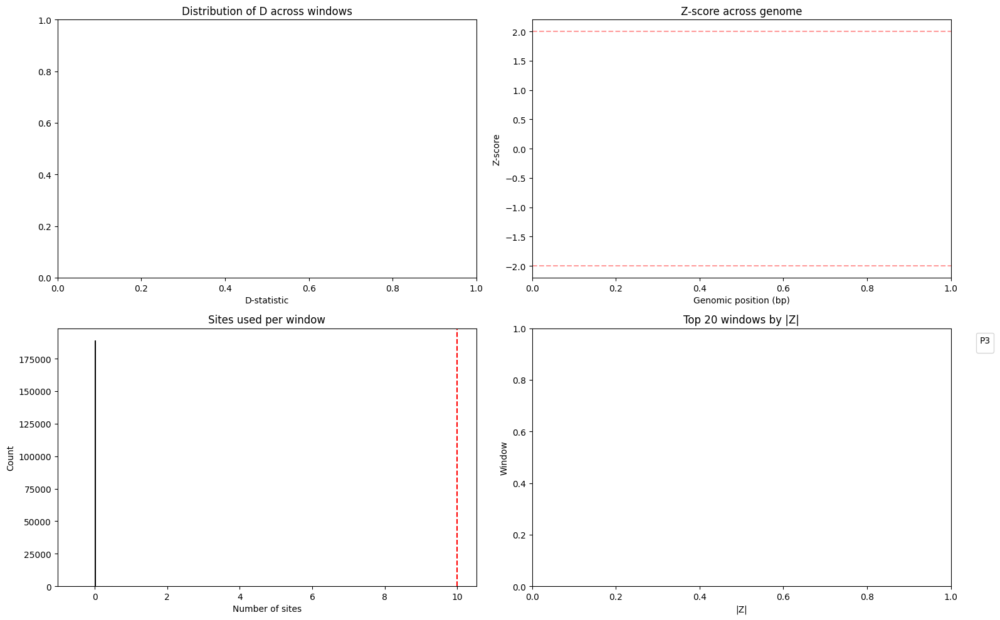

In [27]:
def summarize_sliding_results(sliding_df, z_threshold=2.0, min_sites=10):
    if sliding_df is None or sliding_df.empty:
        print("No sliding window results to summarize.")
        return None

    summary = {}
    summary['total_windows'] = len(sliding_df)
    summary['qc_passing'] = int(sliding_df['passes_qc'].sum())
    summary['mean_abs_D'] = sliding_df['abs_D'].mean()
    summary['max_abs_D'] = sliding_df['abs_D'].max()
    summary['mean_abs_Z'] = sliding_df['abs_Z'].mean()
    summary['max_abs_Z'] = sliding_df['abs_Z'].max()
    summary['mean_sites'] = sliding_df['sites_used'].mean()
    summary['median_sites'] = sliding_df['sites_used'].median()
    summary['z_threshold'] = z_threshold
    summary['min_sites'] = min_sites

    summary_df = pd.DataFrame([summary])
    display(summary_df)
    return summary_df

def plot_sliding_results(sliding_df, top_n=20):
    if sliding_df is None or sliding_df.empty:
        print("No data to plot.")
        return None

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    sns.histplot(sliding_df['D'].dropna(), bins=50, ax=axes[0], kde=True, color='steelblue')
    axes[0].set_title('Distribution of D across windows')
    axes[0].set_xlabel('D-statistic')

    sns.scatterplot(
        data=sliding_df.dropna(subset=['midpoint', 'Z']),
        x='midpoint',
        y='Z',
        hue='chrom',
        palette='tab20',
        legend=False,
        ax=axes[1]
    )
    axes[1].axhline(2, color='red', linestyle='--', alpha=0.4)
    axes[1].axhline(-2, color='red', linestyle='--', alpha=0.4)
    axes[1].set_title('Z-score across genome')
    axes[1].set_xlabel('Genomic position (bp)')
    axes[1].set_ylabel('Z-score')

    sns.histplot(sliding_df['sites_used'].dropna(), bins=50, ax=axes[2], color='darkgreen')
    axes[2].axvline(config.get('abba_baba', {}).get('min_sites', 10), color='red', linestyle='--')
    axes[2].set_title('Sites used per window')
    axes[2].set_xlabel('Number of sites')

    top_hits = (sliding_df.dropna(subset=['abs_Z'])
                .sort_values('abs_Z', ascending=False)
                .head(top_n))
    sns.barplot(
        data=top_hits,
        x='abs_Z',
        y=[f"{row['chrom']}:{row['start']}-{row['end']}" for _, row in top_hits.iterrows()],
        hue='P3',
        dodge=False,
        ax=axes[3]
    )
    axes[3].set_title(f'Top {top_n} windows by |Z|')
    axes[3].set_xlabel('|Z|')
    axes[3].set_ylabel('Window')
    axes[3].legend(title='P3', bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    return fig

summary_df = None
if sliding_results_df is not None and not sliding_results_df.empty:
    summary_df = summarize_sliding_results(
        sliding_results_df,
        z_threshold=config.get('abba_baba', {}).get('z_threshold', 2.0),
        min_sites=config.get('abba_baba', {}).get('min_sites', 10)
    )
    plot_sliding_results(sliding_results_df)
else:
    print("Sliding window results unavailable. Run previous steps first.")

,total_windows,qc_passing,mean_abs_D,max_abs_D,mean_abs_Z,max_abs_Z,mean_sites,median_sites,z_threshold,min_sites
0,188898,0,NaN,NaN,NaN,NaN,0.0,0.0,2.0,10


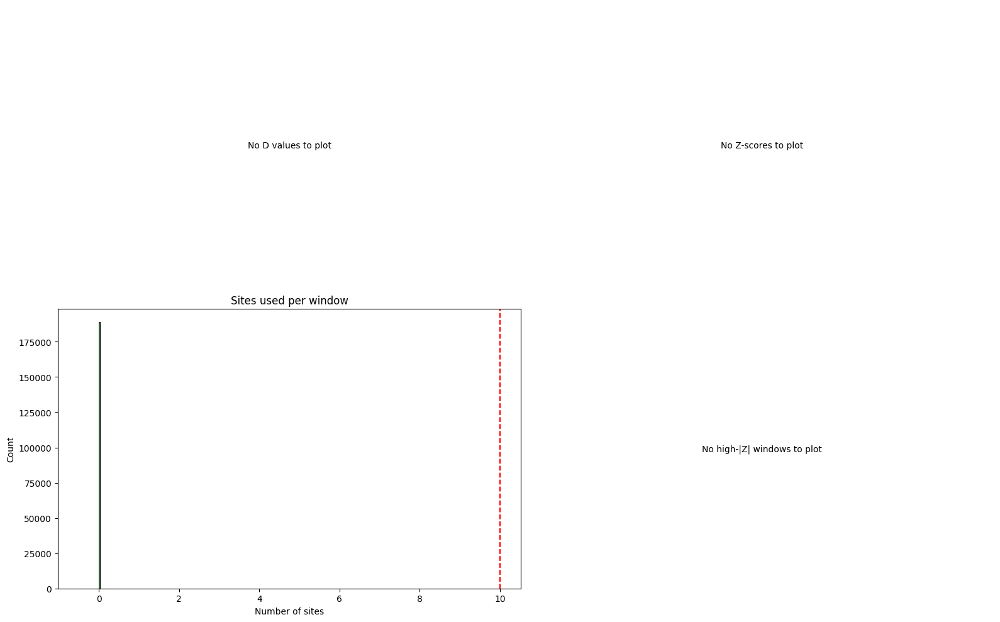

In [28]:
def summarize_sliding_results(sliding_df, z_threshold=2.0, min_sites=10):
    if sliding_df is None or sliding_df.empty:
        print("No sliding window results to summarize.")
        return None

    summary = {
        'total_windows': len(sliding_df),
        'qc_passing': int(sliding_df['passes_qc'].sum()),
        'mean_abs_D': sliding_df['abs_D'].mean(),
        'max_abs_D': sliding_df['abs_D'].max(),
        'mean_abs_Z': sliding_df['abs_Z'].mean(),
        'max_abs_Z': sliding_df['abs_Z'].max(),
        'mean_sites': sliding_df['sites_used'].mean(),
        'median_sites': sliding_df['sites_used'].median(),
        'z_threshold': z_threshold,
        'min_sites': min_sites,
    }
    summary_df = pd.DataFrame([summary])
    display(summary_df)
    return summary_df


def plot_sliding_results(sliding_df, top_n=20):
    if sliding_df is None or sliding_df.empty:
        print("No data to plot.")
        return None

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    d_vals = sliding_df['D'].dropna()
    if len(d_vals) > 0:
        sns.histplot(d_vals, bins=min(50, len(d_vals)), ax=axes[0], kde=True, color='steelblue')
        axes[0].set_title('Distribution of D across windows')
        axes[0].set_xlabel('D-statistic')
    else:
        axes[0].text(0.5, 0.5, 'No D values to plot', ha='center', va='center')
        axes[0].set_axis_off()

    scatter_df = sliding_df.dropna(subset=['midpoint', 'Z'])
    if not scatter_df.empty:
        hue_col = 'chrom' if 'chrom' in scatter_df.columns and scatter_df['chrom'].nunique() > 1 else None
        sns.scatterplot(
            data=scatter_df,
            x='midpoint',
            y='Z',
            hue=hue_col,
            palette='tab20' if hue_col else None,
            legend=bool(hue_col),
            ax=axes[1],
            color=None if hue_col else 'slateblue'
        )
        axes[1].axhline(2, color='red', linestyle='--', alpha=0.4)
        axes[1].axhline(-2, color='red', linestyle='--', alpha=0.4)
        axes[1].set_title('Z-score across genome')
        axes[1].set_xlabel('Genomic position (bp)')
        axes[1].set_ylabel('Z-score')
        if hue_col:
            axes[1].legend(title='Chromosome', bbox_to_anchor=(1.01, 1), loc='upper left')
    else:
        axes[1].text(0.5, 0.5, 'No Z-scores to plot', ha='center', va='center')
        axes[1].set_axis_off()

    sites_vals = sliding_df['sites_used'].dropna()
    if len(sites_vals) > 0:
        sns.histplot(sites_vals, bins=min(50, len(sites_vals)), ax=axes[2], color='darkgreen')
        axes[2].axvline(config.get('abba_baba', {}).get('min_sites', 10), color='red', linestyle='--')
        axes[2].set_title('Sites used per window')
        axes[2].set_xlabel('Number of sites')
    else:
        axes[2].text(0.5, 0.5, 'No site counts to plot', ha='center', va='center')
        axes[2].set_axis_off()

    top_hits = (sliding_df.dropna(subset=['abs_Z'])
                .sort_values('abs_Z', ascending=False)
                .head(top_n))
    if not top_hits.empty:
        sns.barplot(
            data=top_hits,
            x='abs_Z',
            y=[f"{row['chrom']}:{row['start']}-{row['end']}" for _, row in top_hits.iterrows()],
            hue='P3',
            dodge=False,
            ax=axes[3]
        )
        axes[3].set_title(f'Top {top_hits.shape[0]} windows by |Z|')
        axes[3].set_xlabel('|Z|')
        axes[3].set_ylabel('Window (chrom:start-end)')
        axes[3].legend(title='P3', bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axes[3].text(0.5, 0.5, 'No high-|Z| windows to plot', ha='center', va='center')
        axes[3].set_axis_off()

    plt.tight_layout()
    return fig


summary_df = None
if sliding_results_df is not None and not sliding_results_df.empty:
    summary_df = summarize_sliding_results(
        sliding_results_df,
        z_threshold=config.get('abba_baba', {}).get('z_threshold', 2.0),
        min_sites=config.get('abba_baba', {}).get('min_sites', 10)
    )
    plot_sliding_results(sliding_results_df)
else:
    print("Sliding window results unavailable. Run previous steps first.")

In [29]:
import pandas as pd
from pathlib import Path

path = Path("outputs/sliding_window_results.csv")
df = pd.read_csv(path)

print(f"Rows: {len(df)}")
display(df[["D", "Z", "sites_used", "ABBA", "BABA"]].describe(include="all"))

print("\nExample rows with data:")
display(df.dropna(subset=["D"]).head())

Rows: 188898


,D,Z,sites_used,ABBA,BABA
count,0.0,0.0,188898.0,188898.0,188898.0
mean,NaN,NaN,0.0,0.0,0.0
std,NaN,NaN,0.0,0.0,0.0
min,NaN,NaN,0.0,0.0,0.0
25%,NaN,NaN,0.0,0.0,0.0
50%,NaN,NaN,0.0,0.0,0.0
75%,NaN,NaN,0.0,0.0,0.0
max,NaN,NaN,0.0,0.0,0.0



Example rows with data:


,chrom,start,end,midpoint,window_size,P1,P2,P3,outgroup,D,Z,sites_used,ABBA,BABA,passes_qc,abs_D,abs_Z
